<a href="https://colab.research.google.com/github/zzcn23/ZoeCannprojects.ipynb/blob/main/Copy_of_Unit9Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Your file on your github needs to be a a .ipynb file with the first four letters of one first name, the first four letters of one last name, and U6proj.

Ex1.

A student named Avy Aguacate Avocado Palta will submit a file named "Avy_AvocU8proj.ipynb", since she normally just goes by Avy, and, when pressed, reports Avocado as her last name. The " _ " after "Avy" serves as the fourth "letter" in her first name.

Ex2.

Army Armadillo will submit a file named "ArmyArmaU8proj.ipynb"

# Unit 9 Project: Your first neural network

**Task**:

Two parts:

1. Get a data set approved by your instructor (me). It must have either: three or more variables OR a sufficiently complicated relationship between two of the variables.

2. Create, analyze, and present a multi-layer non-linear neural network using the python programming language. Remember that visualizing your model is part of analyzing it.


In [1]:
!pip install pymc-bart
!pip install preliz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.6/519.6 kB 6.2 MB/s eta 0:00:00


In [2]:
import torch
import numpy as np
from torch import nn
import pandas as pd
import sklearn
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [3]:
bdraft = pd.read_csv("https://raw.githubusercontent.com/zzcn23/ZoeCannprojects.ipynb/refs/heads/main/draft-data-20-years%20(1).csv").dropna()
#drops all the non-numerical columns


In [4]:
bdraft.query("TOTMP > 3000", inplace=True)

In [5]:
bdraft

,Unnamed: 0,Rk,Pk,Tm,Player,College,Yrs,G,TOTMP,TOTPTS,...,WS/48,BPM,VORP,DraftYr,MPG,PPG,RPG,APG,playerurl,DraftYear
0,1,1,1,BRK,Derrick Coleman,Syracuse,15.0,781.0,25903.0,12884.0,...,0.119,1.4,22.3,1990,33.2,16.5,9.3,2.5,https://www.sports-reference.com/cbb/players/d...,1990
1,2,2,2,OKC,Gary Payton,Oregon State,17.0,1335.0,47117.0,21813.0,...,0.148,3.3,62.5,1990,35.3,16.3,3.9,6.7,https://www.sports-reference.com/cbb/players/g...,1990
2,3,3,3,DEN,Mahmoud Abdul-Rauf,LSU,9.0,586.0,15628.0,8553.0,...,0.077,-0.8,4.5,1990,26.7,14.6,1.9,3.5,https://www.sports-reference.com/cbb/players/m...,1990
3,4,4,4,ORL,Dennis Scott,Georgia Tech,10.0,629.0,17983.0,8094.0,...,0.089,0.2,9.9,1990,28.6,12.9,2.8,2.1,https://www.sports-reference.com/cbb/players/d...,1990
4,5,5,5,CHA,Kendall Gill,Illinois,15.0,966.0,29481.0,12914.0,...,0.078,0.1,15.8,1990,30.5,13.4,4.1,3.0,https://www.sports-reference.com/cbb/players/k...,1990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1748,1749,1,1,MIN,Anthony Edwards,Georgia,2.0,125.0,4148.0,2551.0,...,0.045,-0.7,1.4,2020,33.2,20.4,4.7,3.2,https://www.sports-reference.com/cbb/players/a...,2020
1752,1753,5,5,CLE,Isaac Okoro,Auburn,2.0,110.0,3413.0,1031.0,...,0.051,-3.9,-1.6,2020,31.0,9.4,3.1,1.9,https://www.sports-reference.com/cbb/players/i...,2020
1759,1760,12,12,SAC,Tyrese Haliburton,Iowa State,2.0,113.0,3658.0,1563.0,...,0.109,2.1,3.8,2020,32.4,13.8,3.4,6.5,https://www.sports-reference.com/cbb/players/t...,2020
1766,1767,19,19,BRK,Saddiq Bey,Villanova,2.0,128.0,3859.0,1782.0,...,0.070,-0.6,1.4,2020,30.1,13.9,5.1,2.0,https://www.sports-reference.com/cbb/players/s...,2020


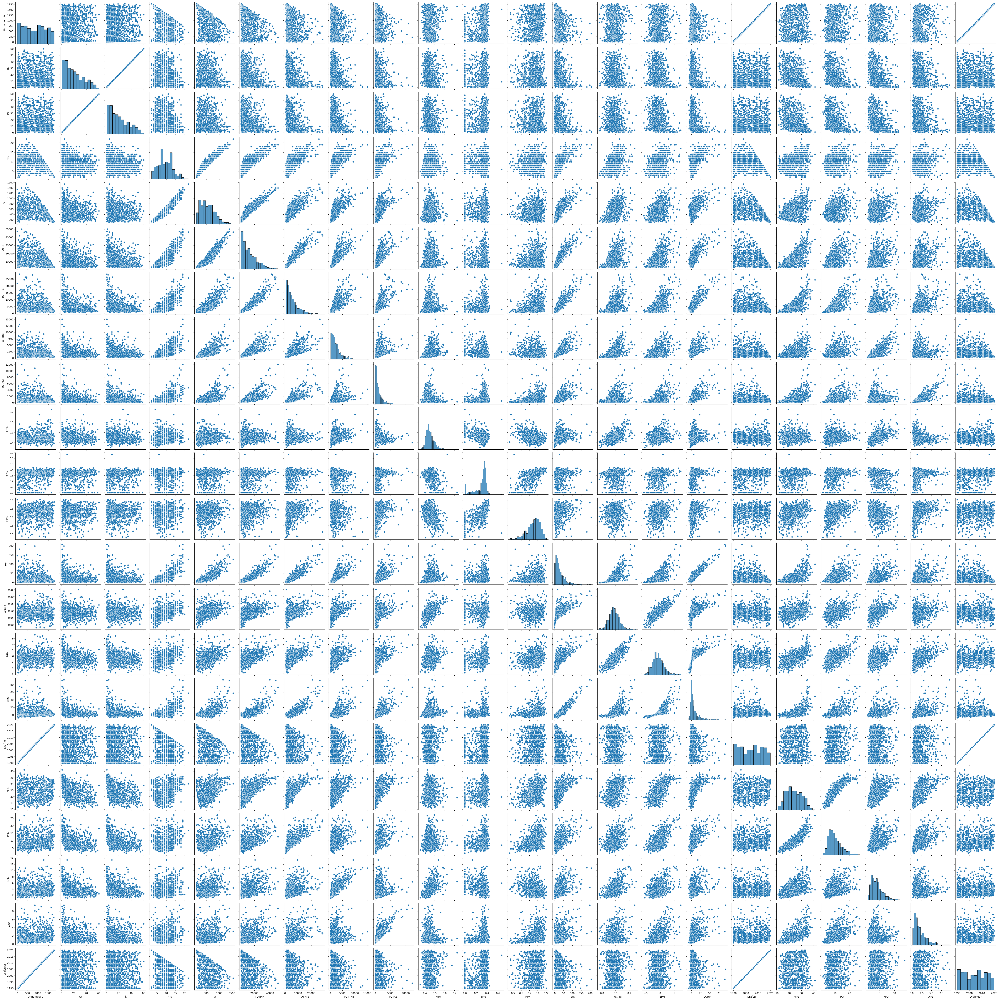

In [7]:
sns.pairplot(bdraft)

In light of the playoffs (go knicks), I decided I wanted to try to predict NBA draft pick numbers using variables from players time in the NBA

It looks like the variables with the strongest correlation to pick are TOTMP, TOTPTS, WS, and VORP, based on my causal diagram, I thought total points scored would be the best one to start with because its pretty straight forward. Players who scored the most points in the NBA probably were higher draft picks because they were good previously

In [5]:
#convert to a PyTorch tensor
t = bdraft.TOTPTS.to_numpy()
TOTPTS = torch.from_numpy(t)
p = bdraft.Pk.to_numpy()
Pk = torch.from_numpy(p)

In [6]:
X = TOTPTS.unsqueeze(dim=1) #use TOTPTS as a predictor
y = Pk.unsqueeze(dim=1) #Pk is the estimand, the thing we're predicting.


In [7]:
# Scale the height(rent) using standardization
scaler = StandardScaler()
TOTPTS_scaled = scaler.fit_transform(
    TOTPTS.reshape(-1, 1) #makes it a column vector
    )

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    TOTPTS_scaled, Pk, test_size=0.2,
)

# Convert to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32)

<ipython-input-7-ed63b38f05f4>:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_train = torch.tensor(y_train, dtype=torch.float32)
<ipython-input-7-ed63b38f05f4>:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_test = torch.tensor(y_test, dtype=torch.float32)


In [8]:
# Two layer nn with nn.Sequential
model_1 = nn.Sequential(
    #out_features is 7, for 7 nodes/neurons/knots
    nn.Linear(in_features=1, out_features=7),

    nn.RReLU(), #this will make our nn more like BART,
    #except with diagonal lines instead of veritcal lines

    #in_features is 7, for 7 nodes/neurons/knots
    nn.Linear(in_features=7, out_features=1),
)

In [9]:
# Create a loss function
loss_fn = nn.MSELoss()

# Create an optimizer; SGD is stochastic gradient decent
optimizer = torch.optim.SGD(params=model_1.parameters(),
                            lr=0.0001) #this is how fast it optimizes; smaller is slower, but more consistent

In [10]:
# Set the number of epochs; this is how many times we update our model
epochs = 5000

for epoch in range(epochs):
    ### Training

    #this allows our matrices to update
    model_1.train()

    # 1. Forward pass; makes predictions
    y_pred = model_1(X_train)

    # 2. Calculate loss; how bad were our predictions?
    loss = loss_fn(y_pred.squeeze(), y_train)

    # 3. Optimizer zero grad; resets how we change our model
    optimizer.zero_grad()

    # 4. Loss backwards; determines how to change our weights matrix
    loss.backward()

    # 5. Optimizer step; changes our weights matrix based on .backward()
    optimizer.step()

    ### Testing
    model_1.eval() #forces our matrices to stay the same
    with torch.inference_mode():
      # 1. Forward pass; makes predictions, but with test data
      test_pred = model_1(X_test)
      # 2. Calculate the loss, but with test data
      test_loss = loss_fn(test_pred, y_test)

    # Print out what's happening
    if epoch % 200 == 0: #prints every 200 epochs
        print(f"Epoch: {epoch} | Train loss: {loss:.5f}, Test loss: {test_loss:.5f}")

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([152])) that is different to the input size (torch.Size([152, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch: 0 | Train loss: 636.26642, Test loss: 536.12756
Epoch: 200 | Train loss: 476.41476, Test loss: 399.85059
Epoch: 400 | Train loss: 275.39609, Test loss: 244.42104
Epoch: 600 | Train loss: 195.41528, Test loss: 200.82185
Epoch: 800 | Train loss: 187.22299, Test loss: 203.72128
Epoch: 1000 | Train loss: 186.86479, Test loss: 205.05731
Epoch: 1200 | Train loss: 186.72159, Test loss: 204.97169
Epoch: 1400 | Train loss: 186.76205, Test loss: 204.68179
Epoch: 1600 | Train loss: 186.71184, Test loss: 204.47305
Epoch: 1800 | Train loss: 186.75836, Test loss: 204.35094
Epoch: 2000 | Train loss: 186.74551, Test loss: 204.27565
Epoch: 2200 | Train loss: 186.79308, Test loss: 204.23381
Epoch: 2400 | Train loss: 186.70927, Test loss: 204.21042
Epoch: 2600 | Train loss: 186.71490, Test loss: 204.19644
Epoch: 2800 | Train loss: 186.75397, Test loss: 204.18434
Epoch: 3000 | Train loss: 186.71091, Test loss: 204.17915
Epoch: 3200 | Train loss: 186.76146, Test loss: 204.17540
Epoch: 3400 | Train l

In [11]:
# Turn on evaluation mode
model_1.eval()

# Make predictions (inference)
with torch.inference_mode():
    y_preds = model_1(X_test)

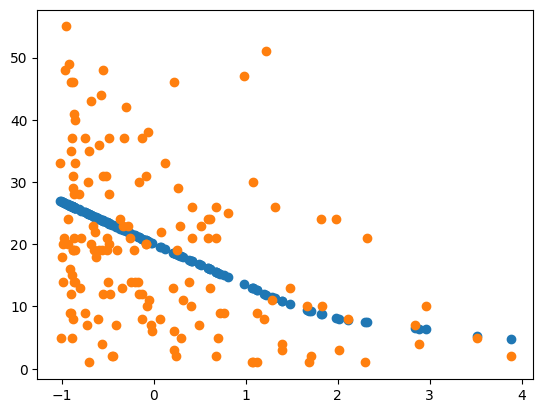

In [12]:
#plots predictions--remember, our model has never seen X_test
plt.scatter(X_test.detach().numpy(),y_preds.detach().numpy())

#plots test data
plt.scatter(X_test.detach().numpy(),y_test.detach().numpy())

This is okay, the model captures the general downward trend of the data but isn't super steep and misses the variability at the start. I decided I wanted to add more layers to see if that helped

#Multi layer nueral network

In [14]:
# Two layer nn with nn.Sequential
model_2 = nn.Sequential(
    #our input is a vector, so 1 diminsion.
    nn.Linear(in_features=1, out_features=32,),
    nn.RReLU(),

    #hidden layer with 32 nodes
    nn.Linear(in_features=32, out_features=16, ),
    nn.RReLU(),

    #moves to hidden layer with 16 nodes
    nn.Linear(in_features=16, out_features=8, ),
    nn.RReLU(),

    #hidden layer with 8 nodes
    nn.Linear(in_features=8, out_features=4, ),
    nn.RReLU(),

    #hidden layer with 4 nodes
    nn.Linear(in_features=4, out_features=1, ),
    #outputs a vector of predicted weights
)

In [15]:
# Create a loss function
loss_fn = nn.MSELoss()

# Create an optimizer; SGD is stochastic gradient decent
optimizer = torch.optim.SGD(params=model_2.parameters(),
                            lr=0.0001) #this is how fast it optimizes; smaller is slower, but more consistent

In [16]:
# Set the number of epochs; this is how many times we update our model
epochs = 5000

for epoch in range(epochs):
    ### Training

    #this allows our matrices to update
    model_2.train()

    # 1. Forward pass; makes predictions
    y_pred = model_2(X_train)

    # 2. Calculate loss; how bad were our predictions?
    loss = loss_fn(y_pred.squeeze(), y_train)

    # 3. Optimizer zero grad; resets how we change our model
    optimizer.zero_grad()

    # 4. Loss backwards; determines how to change our weights matrix
    loss.backward()

    # 5. Optimizer step; changes our weights matrix based on .backward()
    optimizer.step()

    ### Testing
    model_2.eval() #forces our matrices to stay the same
    with torch.inference_mode():
      # 1. Forward pass; makes predictions, but with test data
      test_pred = model_2(X_test)
      # 2. Calculate the loss, but with test data
      test_loss = loss_fn(test_pred, y_test)

    # Print out what's happening
    if epoch % 200 == 0: #prints every 200 epochs
        print(f"Epoch: {epoch} | Train loss: {loss:.5f}, Test loss: {test_loss:.5f}")

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([152])) that is different to the input size (torch.Size([152, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch: 0 | Train loss: 654.31128, Test loss: 554.36920
Epoch: 200 | Train loss: 619.95862, Test loss: 522.02789
Epoch: 400 | Train loss: 587.93689, Test loss: 491.87604
Epoch: 600 | Train loss: 543.56537, Test loss: 450.40384
Epoch: 800 | Train loss: 187.48459, Test loss: 197.10938
Epoch: 1000 | Train loss: 186.79205, Test loss: 204.03596
Epoch: 1200 | Train loss: 186.55511, Test loss: 204.41687
Epoch: 1400 | Train loss: 186.57283, Test loss: 204.46524
Epoch: 1600 | Train loss: 186.71698, Test loss: 204.52409
Epoch: 1800 | Train loss: 186.44725, Test loss: 204.49828
Epoch: 2000 | Train loss: 186.20830, Test loss: 204.54124
Epoch: 2200 | Train loss: 186.88379, Test loss: 204.46133
Epoch: 2400 | Train loss: 186.52251, Test loss: 204.49065
Epoch: 2600 | Train loss: 186.31909, Test loss: 204.50827
Epoch: 2800 | Train loss: 186.78247, Test loss: 204.50914
Epoch: 3000 | Train loss: 186.72540, Test loss: 204.50130
Epoch: 3200 | Train loss: 186.26241, Test loss: 204.50128
Epoch: 3400 | Train l

In [17]:
# Turn on evaluation mode
model_2.eval()

# Make predictions (inference)
with torch.inference_mode():
    y_preds = model_2(X_test)

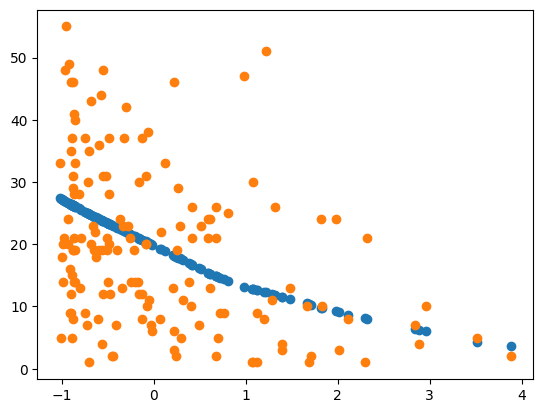

In [18]:
#plots predictions--remember, our model has never seen X_test
plt.scatter(X_test.detach().numpy(),y_preds.detach().numpy())

#plots test data
plt.scatter(X_test.detach().numpy(),y_test.detach().numpy())

This looks super similar to the previous graph, in this case the relationship between the data is probably not super complicated so adding new layers with high/low numbers of nodes didn't really matter

#multivariable

Next I decided to try using total points and win share (team wins attributed to a player) to predict draft pick since win share also has a graph with a clear trend

In [19]:
shoot2 = bdraft[["TOTPTS","WS"]]

In [20]:
#convert to a PyTorch tensor
#convert to a PyTorch tensor
shoot2 = bdraft[["TOTPTS","WS"]].to_numpy()
shoot2 = torch.from_numpy(shoot2)
Pk = bdraft["Pk"].to_numpy()
Pk = torch.from_numpy(Pk)

In [21]:
X = shoot2.unsqueeze(dim=1) #use height as a predictor
y = Pk.unsqueeze(dim=1) #weight is the estimand, the thing we're predicting.

In [22]:
# Scale the tensor using standardization
scaler = StandardScaler()
shoot2_scaled = scaler.fit_transform(shoot2) # shoot2 already has the correct shape for StandardScaler

# Scale the Total Interactions using standardization
scaler_y = StandardScaler() # Use a different scaler for the target variable
Pk_scaled = scaler_y.fit_transform(Pk.reshape(-1, 1))

# Split data into training and testing sets
# Use th_scaled as the input features (X) and rent_scaled as the target (y)
X_train, X_test, y_train, y_test = train_test_split(
    shoot2_scaled, Pk_scaled, test_size=0.2, random_state=42 # Added random_state for reproducibility
)

# Convert to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32)

In [23]:
# Two layer nn with nn.Sequential
model_4 = nn.Sequential(
    #out_features is 7, for 7 nodes/neurons/knots
    nn.Linear(in_features=2, out_features=7),

    nn.RReLU(),

    #in_features is 7, for 7 nodes/neurons/knots
    nn.Linear(in_features=7, out_features=1),
)

In [24]:

# Create a loss function
loss_fn = nn.MSELoss()

# Create an optimizer; SGD is stochastic gradient decent
optimizer = torch.optim.SGD(params=model_4.parameters(),
                            lr=0.0001)


In [25]:
# Set the number of epochs; this is how many times we update our model
epochs = 10000

for epoch in range(epochs):
    ### Training

    #this allows our matrices to update
    model_4.train()

    # 1. Forward pass; makes predictions
    y_pred = model_4(X_train)

    # 2. Calculate loss; how bad were our predictions?
    loss = loss_fn(y_pred, y_train) # Removed .squeeze() from y_pred

    # 3. Optimizer zero grad; resets how we change our model
    optimizer.zero_grad()

    # 4. Loss backwards; determines how to change our weights matrix
    loss.backward()

    # 5. Optimizer step; changes our weights matrix based on .backward()
    optimizer.step()

    ### Testing
    model_4.eval() #forces our matrices to stay the same
    with torch.inference_mode():
      # 1. Forward pass; makes predictions, but with test data
      test_pred = model_4(X_test)
      # 2. Calculate the loss, but with test data
      test_loss = loss_fn(test_pred, y_test)

    # Print out what's happening
    if epoch % 200 == 0: #prints every 200 epochs
        print(f"Epoch: {epoch} | Train loss: {loss:.5f}, Test loss: {test_loss:.5f}")

Epoch: 0 | Train loss: 1.13063, Test loss: 1.13606
Epoch: 200 | Train loss: 1.11893, Test loss: 1.12258
Epoch: 400 | Train loss: 1.10490, Test loss: 1.10993
Epoch: 600 | Train loss: 1.09359, Test loss: 1.09808
Epoch: 800 | Train loss: 1.08434, Test loss: 1.08697
Epoch: 1000 | Train loss: 1.07421, Test loss: 1.07657
Epoch: 1200 | Train loss: 1.06674, Test loss: 1.06675
Epoch: 1400 | Train loss: 1.05709, Test loss: 1.05750
Epoch: 1600 | Train loss: 1.05045, Test loss: 1.04881
Epoch: 1800 | Train loss: 1.04097, Test loss: 1.04058
Epoch: 2000 | Train loss: 1.03229, Test loss: 1.03285
Epoch: 2200 | Train loss: 1.02703, Test loss: 1.02556
Epoch: 2400 | Train loss: 1.02063, Test loss: 1.01870
Epoch: 2600 | Train loss: 1.01642, Test loss: 1.01221
Epoch: 2800 | Train loss: 1.01014, Test loss: 1.00604
Epoch: 3000 | Train loss: 1.00783, Test loss: 1.00020
Epoch: 3200 | Train loss: 0.99953, Test loss: 0.99469
Epoch: 3400 | Train loss: 0.99409, Test loss: 0.98949
Epoch: 3600 | Train loss: 0.99384, 

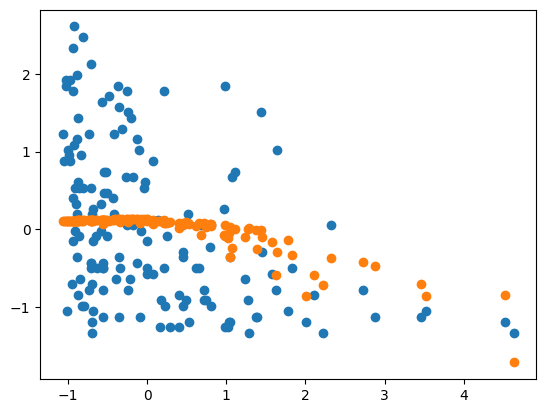

In [26]:

# Turn on evaluation mode
model_4.eval()

# Make predictions (inference)
with torch.inference_mode():
    y_preds = model_4(X_test)

# Plot the actual test data
plt.scatter(X_test[:, 0].detach().numpy(), y_test.detach().numpy(), label='Actual Test Data') # Plot against the first feature of X_test

plt.scatter(X_test[:, 0].detach().numpy(), y_preds.detach().numpy(), label='Model Predictions') # y_preds will now have the correct shape

This doesn't look great but it captures some of the data. I'm going to try adding more epochs since there are two predictors now with a relationship between them and the model might need time to adjust

In [36]:
# Two layer nn with nn.Sequential
model_5 = nn.Sequential(
    #out_features is 7, for 7 nodes/neurons/knots
    nn.Linear(in_features=2, out_features=7),

    nn.RReLU(),

    #in_features is 7, for 7 nodes/neurons/knots
    nn.Linear(in_features=7, out_features=1),
)

In [37]:

# Create a loss function
loss_fn = nn.MSELoss()

# Create an optimizer; SGD is stochastic gradient decent
optimizer = torch.optim.SGD(params=model_5.parameters(),
                            lr=0.0001)


In [38]:
# Set the number of epochs; this is how many times we update our model
epochs = 15000

for epoch in range(epochs):
    ### Training

    #this allows our matrices to update
    model_5.train()

    # 1. Forward pass; makes predictions
    y_pred = model_5(X_train)

    # 2. Calculate loss; how bad were our predictions?
    loss = loss_fn(y_pred, y_train) # Removed .squeeze() from y_pred

    # 3. Optimizer zero grad; resets how we change our model
    optimizer.zero_grad()

    # 4. Loss backwards; determines how to change our weights matrix
    loss.backward()

    # 5. Optimizer step; changes our weights matrix based on .backward()
    optimizer.step()

    ### Testing
    model_5.eval() #forces our matrices to stay the same
    with torch.inference_mode():
      # 1. Forward pass; makes predictions, but with test data
      test_pred = model_5(X_test)
      # 2. Calculate the loss, but with test data
      test_loss = loss_fn(test_pred, y_test)

    # Print out what's happening
    if epoch % 200 == 0: #prints every 200 epochs
        print(f"Epoch: {epoch} | Train loss: {loss:.5f}, Test loss: {test_loss:.5f}")

Epoch: 0 | Train loss: 1.15031, Test loss: 1.20748
Epoch: 200 | Train loss: 1.13331, Test loss: 1.18609
Epoch: 400 | Train loss: 1.11864, Test loss: 1.16616
Epoch: 600 | Train loss: 1.10399, Test loss: 1.14759
Epoch: 800 | Train loss: 1.08730, Test loss: 1.13028
Epoch: 1000 | Train loss: 1.07466, Test loss: 1.11406
Epoch: 1200 | Train loss: 1.06255, Test loss: 1.09880
Epoch: 1400 | Train loss: 1.05380, Test loss: 1.08456
Epoch: 1600 | Train loss: 1.04165, Test loss: 1.07127
Epoch: 1800 | Train loss: 1.03013, Test loss: 1.05885
Epoch: 2000 | Train loss: 1.02305, Test loss: 1.04724
Epoch: 2200 | Train loss: 1.01461, Test loss: 1.03642
Epoch: 2400 | Train loss: 1.00709, Test loss: 1.02631
Epoch: 2600 | Train loss: 0.99542, Test loss: 1.01689
Epoch: 2800 | Train loss: 0.99120, Test loss: 1.00807
Epoch: 3000 | Train loss: 0.98339, Test loss: 0.99983
Epoch: 3200 | Train loss: 0.97498, Test loss: 0.99212
Epoch: 3400 | Train loss: 0.97263, Test loss: 0.98494
Epoch: 3600 | Train loss: 0.96635, 

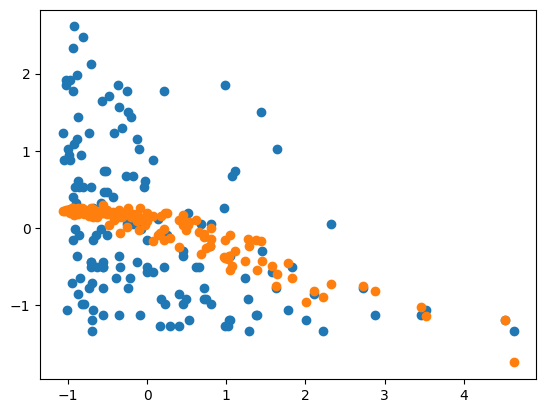

In [40]:

# Turn on evaluation mode
model_5.eval()

# Make predictions (inference)
with torch.inference_mode():
    y_preds = model_5(X_test)

# Plot the actual test data
plt.scatter(X_test[:, 0].detach().numpy(), y_test.detach().numpy(), label='Actual Test Data') # Plot against the first feature of X_test

plt.scatter(X_test[:, 0].detach().numpy(), y_preds.detach().numpy(), label='Model Predictions') # y_preds will now have the correct shape

This is slightly better but not super strong. I'm going to try another set of predictors to see if they work any better

#different predictors


I chose VORP and WS to predict PK. I kept WS because games attributed to player is an important stastic of how important a player is to the team and correlates to their draft pick. VORP is calculated using Box Plus/Minus (BPM), which is a stat that quantifies how many points a player scores or allows per 100 possessions, relative to an average player. I think the graph showed a direct trend between higher VORP and better draft pick (lower) and its a good measure of a players overall contribution to a team and therefore how good they are.

In [42]:
shoot3 = bdraft[["VORP","WS"]]

In [43]:
#convert to a PyTorch tensor
#convert to a PyTorch tensor
shoot3 = bdraft[["VORP","WS"]].to_numpy()
shoot3 = torch.from_numpy(shoot3)
Pk = bdraft["Pk"].to_numpy()
Pk = torch.from_numpy(Pk)

In [44]:
X = shoot3.unsqueeze(dim=1) #use height as a predictor
y = Pk.unsqueeze(dim=1) #weight is the estimand, the thing we're predicting.

In [45]:
# Scale the tensor using standardization
scaler = StandardScaler()
shoot3_scaled = scaler.fit_transform(shoot3) # shoot3 already has the correct shape for StandardScaler

# Scale the Total Interactions using standardization
scaler_y = StandardScaler() # Use a different scaler for the target variable
Pk_scaled = scaler_y.fit_transform(Pk.reshape(-1, 1))

# Split data into training and testing sets
# Use th_scaled as the input features (X) and rent_scaled as the target (y)
X_train, X_test, y_train, y_test = train_test_split(
    shoot3_scaled, Pk_scaled, test_size=0.2, random_state=42 # Added random_state for reproducibility
)

# Convert to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32)

In [46]:
# Two layer nn with nn.Sequential
model_6 = nn.Sequential(
    #out_features is 7, for 7 nodes/neurons/knots
    nn.Linear(in_features=2, out_features=7),

    nn.RReLU(),

    #in_features is 7, for 7 nodes/neurons/knots
    nn.Linear(in_features=7, out_features=1),
)

In [47]:

# Create a loss function
loss_fn = nn.MSELoss()

# Create an optimizer; SGD is stochastic gradient decent
optimizer = torch.optim.SGD(params=model_6.parameters(),
                            lr=0.0001)


In [48]:
# Set the number of epochs; this is how many times we update our model
epochs = 15000

for epoch in range(epochs):
    ### Training

    #this allows our matrices to update
    model_6.train()

    # 1. Forward pass; makes predictions
    y_pred = model_6(X_train)

    # 2. Calculate loss; how bad were our predictions?
    loss = loss_fn(y_pred, y_train) # Removed .squeeze() from y_pred

    # 3. Optimizer zero grad; resets how we change our model
    optimizer.zero_grad()

    # 4. Loss backwards; determines how to change our weights matrix
    loss.backward()

    # 5. Optimizer step; changes our weights matrix based on .backward()
    optimizer.step()

    ### Testing
    model_6.eval() #forces our matrices to stay the same
    with torch.inference_mode():
      # 1. Forward pass; makes predictions, but with test data
      test_pred = model_6(X_test)
      # 2. Calculate the loss, but with test data
      test_loss = loss_fn(test_pred, y_test)

    # Print out what's happening
    if epoch % 200 == 0: #prints every 200 epochs
        print(f"Epoch: {epoch} | Train loss: {loss:.5f}, Test loss: {test_loss:.5f}")

Epoch: 0 | Train loss: 1.46362, Test loss: 1.54709
Epoch: 200 | Train loss: 1.40369, Test loss: 1.48333
Epoch: 400 | Train loss: 1.35510, Test loss: 1.42765
Epoch: 600 | Train loss: 1.31276, Test loss: 1.37877
Epoch: 800 | Train loss: 1.27396, Test loss: 1.33566
Epoch: 1000 | Train loss: 1.23774, Test loss: 1.29748
Epoch: 1200 | Train loss: 1.20942, Test loss: 1.26352
Epoch: 1400 | Train loss: 1.18202, Test loss: 1.23319
Epoch: 1600 | Train loss: 1.15813, Test loss: 1.20602
Epoch: 1800 | Train loss: 1.13851, Test loss: 1.18158
Epoch: 2000 | Train loss: 1.11810, Test loss: 1.15956
Epoch: 2200 | Train loss: 1.10100, Test loss: 1.13965
Epoch: 2400 | Train loss: 1.08437, Test loss: 1.12161
Epoch: 2600 | Train loss: 1.07031, Test loss: 1.10522
Epoch: 2800 | Train loss: 1.05826, Test loss: 1.09027
Epoch: 3000 | Train loss: 1.04459, Test loss: 1.07660
Epoch: 3200 | Train loss: 1.03565, Test loss: 1.06410
Epoch: 3400 | Train loss: 1.02518, Test loss: 1.05263
Epoch: 3600 | Train loss: 1.01732, 

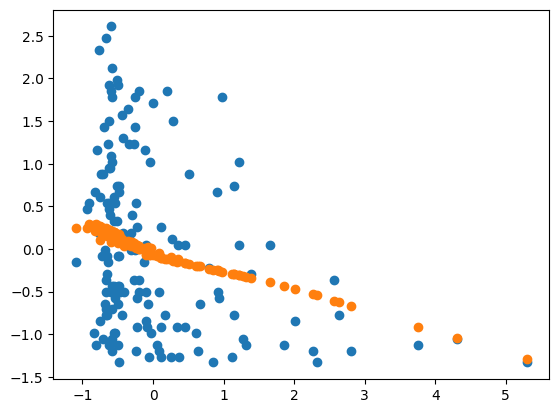

In [49]:

# Turn on evaluation mode
model_6.eval()

# Make predictions (inference)
with torch.inference_mode():
    y_preds = model_6(X_test)

# Plot the actual test data
plt.scatter(X_test[:, 0].detach().numpy(), y_test.detach().numpy(), label='Actual Test Data') # Plot against the first feature of X_test

plt.scatter(X_test[:, 0].detach().numpy(), y_preds.detach().numpy(), label='Model Predictions') # y_preds will now have the correct shape

I think this graph is a lot better, it follows the downward trend a lot more and shows a clear correlation instead of a straight line at the beginning. I think the VORP variable helped a lot in predicting because it directly translates to how important a player is (contributions to team) and making the epoch number higher did as well. This is probably the best one so far as it shows the general trend and captures the more spread out variables at the end. I didn't have enough time to keep trying new variable combinations but I would probably look into more variations of points scored/minutes played with other variables.